In [ ]:
!pip install PyPDF2


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 10.2 MB/s eta 0:00:00


In [ ]:
!pip install poppler-utils

In [ ]:
pip install PyMuPDF Pillow


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 60.0 MB/s eta 0:00:00:00:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 38.1 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install pdfplumber


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 50.0 MB/s eta 0:00:00:00:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 76.8 MB/s eta 0:00:00:00:01


In [ ]:
import pdfplumber
import pandas as pd
with pdfplumber.open('/kaggle/input/pmbok2017/PMBOK6-2017.pdf') as pdf:
    table_count = 0  # Initialize a variable to count the tables

#     # Iterate over each page
#     for page in pdf.pages:
#         tables = page.extract_tables()
#         # Iterate over the extracted tables and display them using pandas
#         for i, table in enumerate(tables, start=1):
#             df = pd.DataFrame(table)
#             display(df)  # Use display to render the table in a Jupyter notebook

#     # Optionally, save the table to a CSV file
#             df.to_csv(f'table_{i}.csv', index=False)
#         # Increment the table count by the number of tables on this page
#         table_count += len(tables)

#     print(f"Total number of tables in the PDF: {table_count}")


# from pdf to images

In [ ]:
# The import name for this library is fitz
import fitz

# Create a document object
doc = fitz.open('/kaggle/input/pmbok2017/PMBOK6-2017.pdf')  # or fitz.Document(filename)

# Extract the number of pages (int)
print(doc.page_count)

# the metadata (dict) e.g., the author,...
print(doc.metadata)

# Get the page by their index
page = doc.load_page(0)
 # or page = doc[0]



# Render and save the page as an image
pix = page.get_pixmap()
pix.save(f"page-{page.number}.png")



# Render and save all the pages as images
for i in range(doc.page_count):
  page = doc.load_page(i)
  pix = page.get_pixmap()
  pix.save("page-%i.png" % page.number)



64
{'format': 'PDF 1.7', 'title': '', 'author': '', 'subject': '', 'keywords': '', 'creator': 'PDFium', 'producer': 'PDFium', 'creationDate': 'D:20230925154337', 'modDate': '', 'trapped': '', 'encryption': None}


In [ ]:
# Import the required library
import fitz
import os

# Define the path to the PDF file
pdf_path = '/kaggle/input/pmbok2017/PMBOK6-2017.pdf'

# Create a document object
doc = fitz.open(pdf_path)

# Create a directory to save the images
output_directory = '/kaggle/working/images'
os.makedirs(output_directory, exist_ok=True)

# Render and save all the pages as images
for i in range(doc.page_count):
    page = doc.load_page(i)
    pix = page.get_pixmap()
    image_path = os.path.join(output_directory, f"page-{page.number}.png")
    pix.save(image_path)

print(f"Images saved to {output_directory}")


Images saved to /kaggle/working/images


In [ ]:
import torch

*********************************************************************************************************************************************************************

In [ ]:
# !git clone https://github.com/ultralytics/yolov5
# %cd yolov5
# %pip install -r "requirements.txt

In [ ]:
!pip install ultralytics==8.0.20

  Using cached ultralytics-8.0.20-py3-none-any.whl (261 kB)
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.199
    Uninstalling ultralytics-8.0.199:
      Successfully uninstalled ultralytics-8.0.199


In [ ]:
!mkdir /kaggle/working/datasets
%cd /kaggle/working/datasets
!pip install roboflow

mkdir: cannot create directory ‘/kaggle/working/datasets’: File exists
/kaggle/working/datasets


In [ ]:
import ultralytics

from roboflow import Roboflow
rf = Roboflow(api_key="5RWC8YZ3QPDUWXFqZaJT")
project = rf.workspace("esprit-rxksi").project("figures-brnq8")
dataset = project.version(8).download("yolov8")



loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.134`



Extracting Dataset Version Zip to Figures-8 in yolov8:: 100%|██████████| 280/280 [00:00<00:00, 7391.77it/s]


In [ ]:
from PIL import Image

image_path = '/kaggle/input/training/page-54.png'
image = Image.open(image_path)

# Get the dimensions (width and height) of the image
width, height = image.size

# Print the dimensions
print(f"Image: {image_path}, Width: {width}, Height: {height}")

Image: /kaggle/input/training/page-54.png, Width: 612, Height: 792


In [ ]:
# %cd /kaggle/working/
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=640 plots=True

100%|███████████████████████████████████████| 21.5M/21.5M [00:00<00:00, 241MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/kaggle/working/datasets/Figures-8/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, 

In [ ]:
# %cd /kaggle/working/datasets
!yolo task=detect mode=predict model=/kaggle/working/datasets/runs/detect/train/weights/best.pt conf=0.3 source=/kaggle/working/images save=output=save.txt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
image 1/64 /kaggle/working/images/page-0.png: 640x512 1 text, 56.9ms
image 2/64 /kaggle/working/images/page-1.png: 640x512 1 figures, 6.6ms
image 3/64 /kaggle/working/images/page-10.png: 640x512 1 text, 6.6ms
image 4/64 /kaggle/working/images/page-11.png: 640x512 1 figures, 6.7ms
image 5/64 /kaggle/working/images/page-12.png: 640x512 1 figures, 1 text, 6.7ms
image 6/64 /kaggle/working/images/page-13.png: 640x512 1 figures, 2 texts, 6.6ms
image 7/64 /kaggle/working/images/page-14.png: 640x512 1 figures, 1 text, 6.6ms
image 8/64 /kaggle/working/images/page-15.png: 640x512

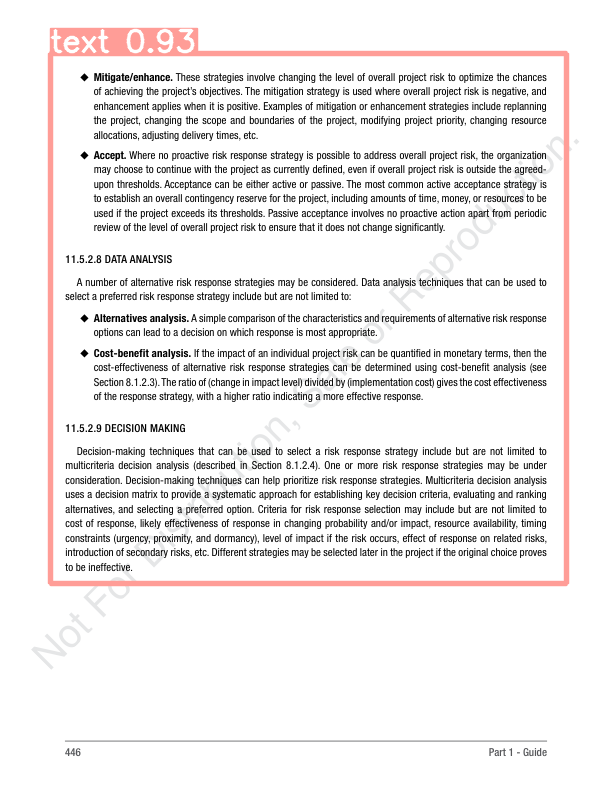

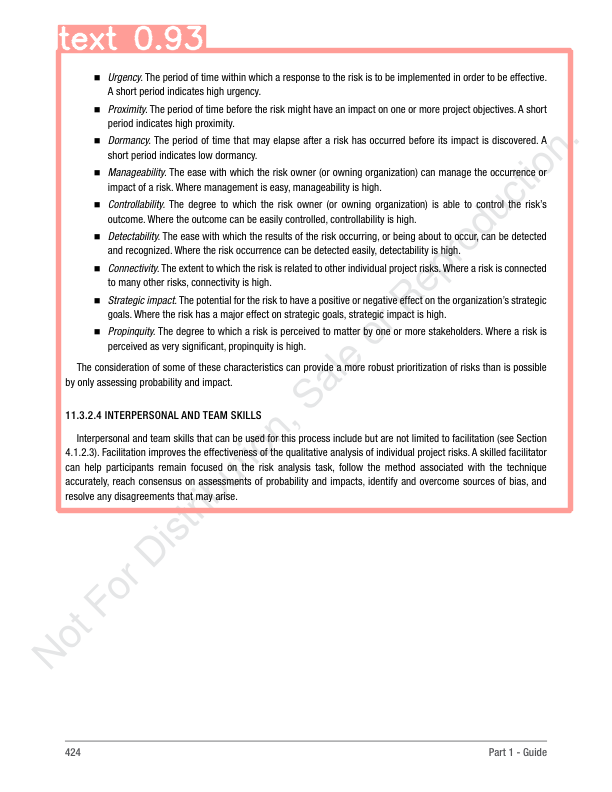

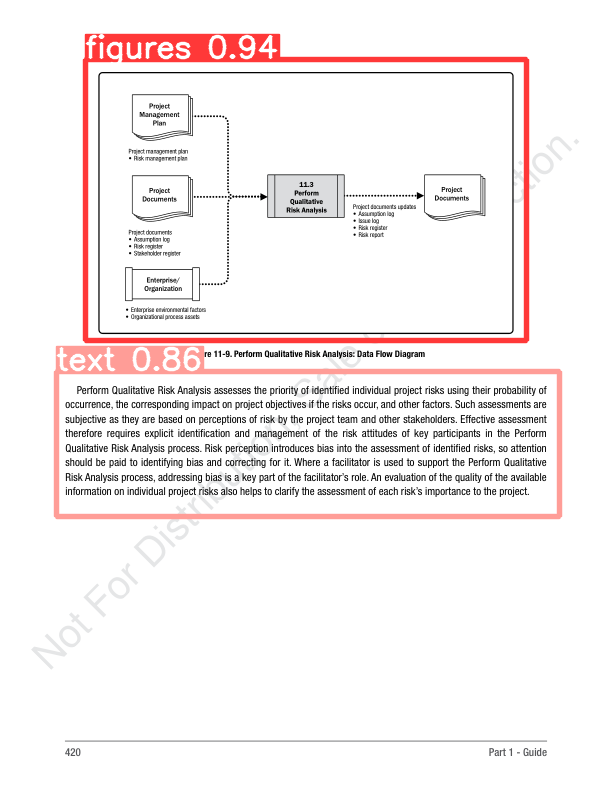

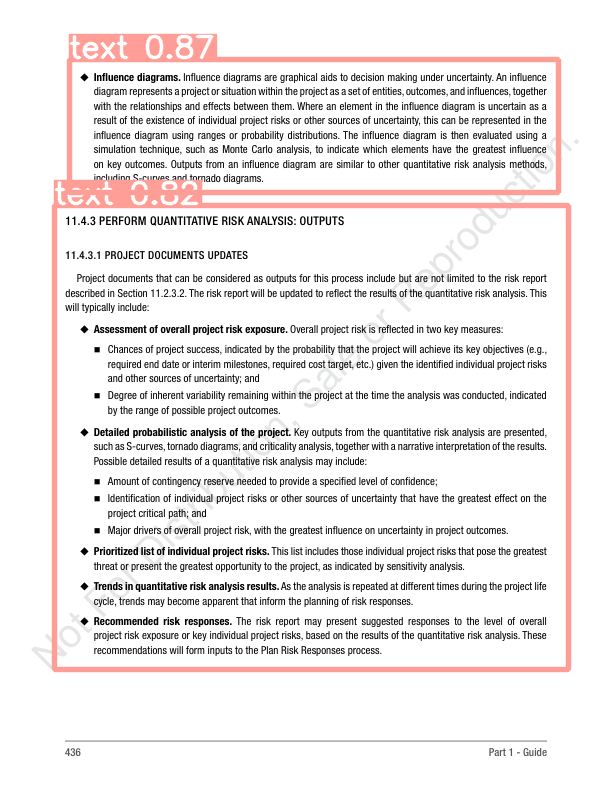

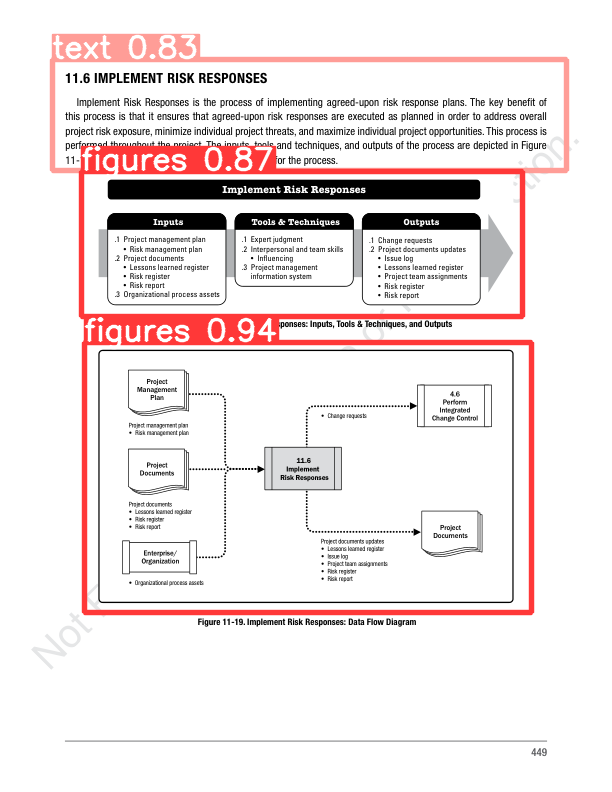

...

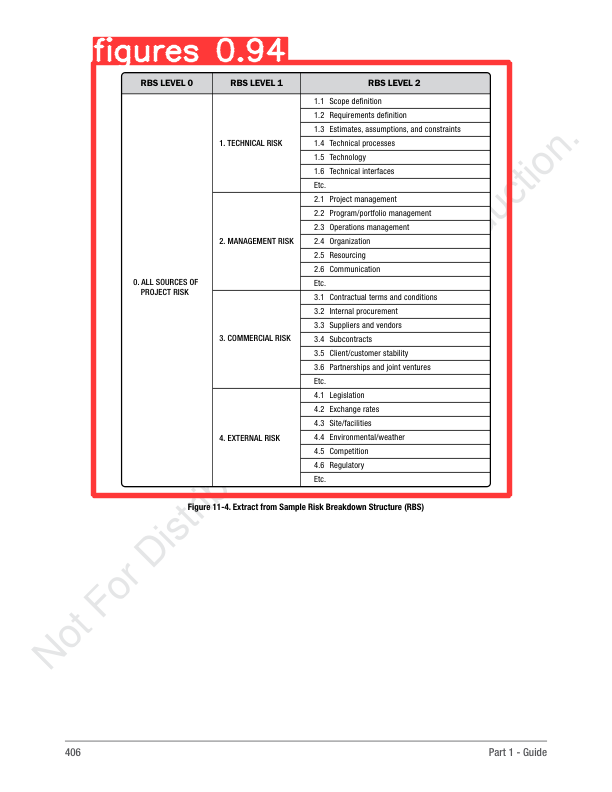

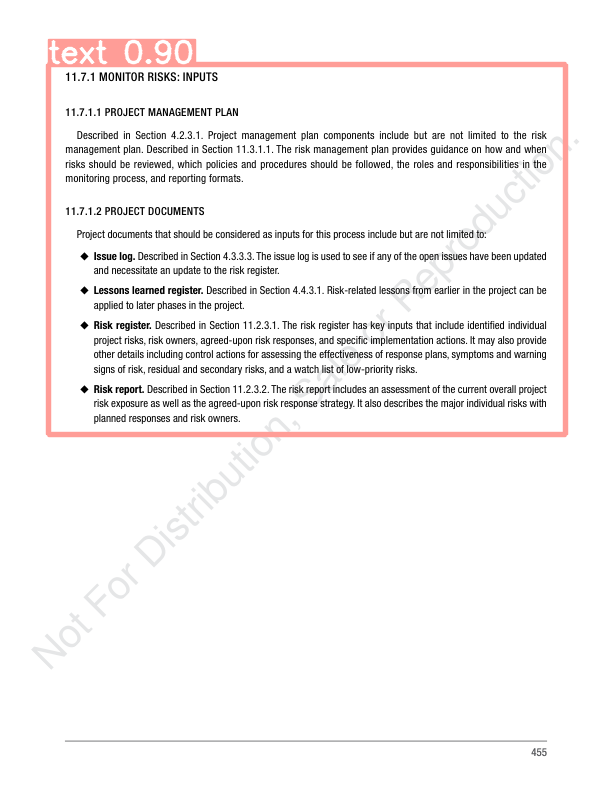

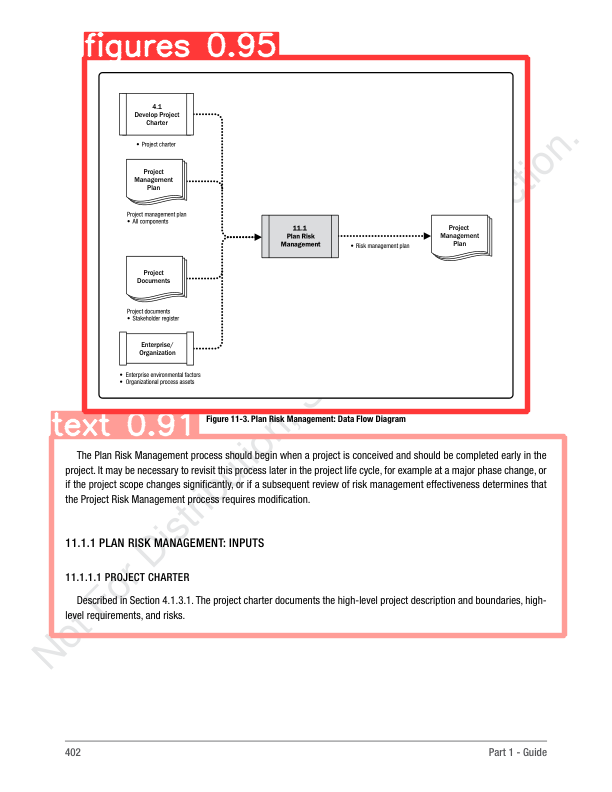

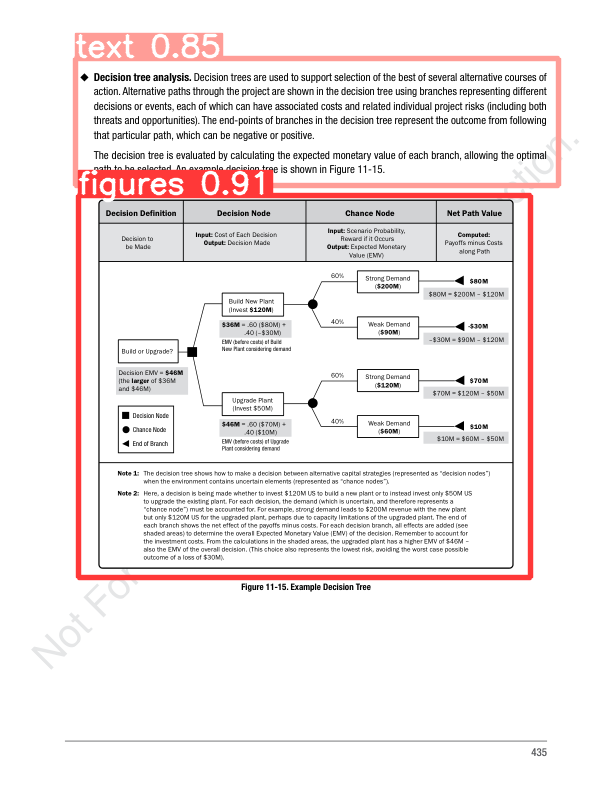

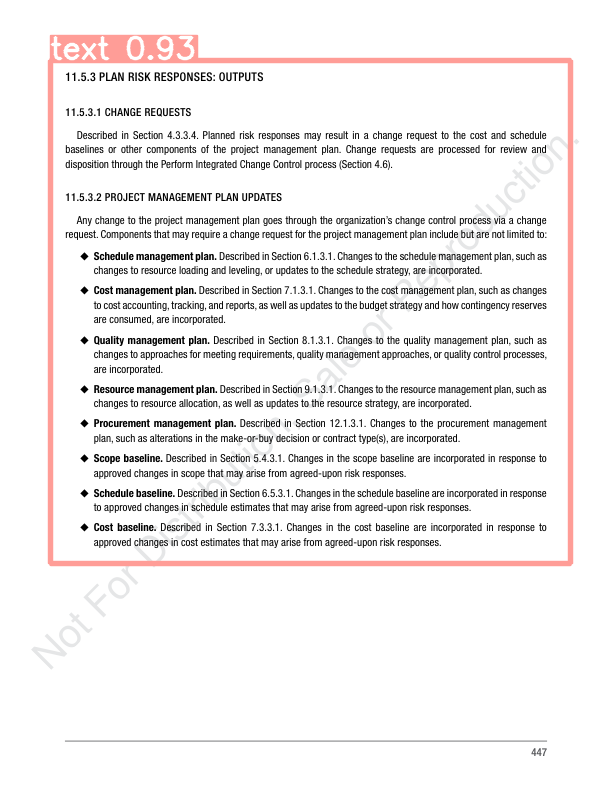

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/kaggle/working/datasets/runs/detect/predict2/*.png')[:60]:
      display(Image(filename=image_path, width=640))


In [ ]:
from PIL import Image

# Open the image
image = Image.open('/kaggle/working/page-7.png')  # Replace 'your_image.jpg' with the path to your image file

# Define the new size (width, height)
new_size = (640, 640)  # Adjust the dimensions as needed

# Resize the image
resized_image = image.resize(new_size, Image.ANTIALIAS)  # You can choose from different resampling filters, here I used ANTIALIAS

# Save the resized image
resized_image.save('resized_image.jpg')  # Save the resized image to a file


ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.


Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs


Bounding Box Coordinates: x1=49.0, y1=67.0, x2=599.0, y2=370.0


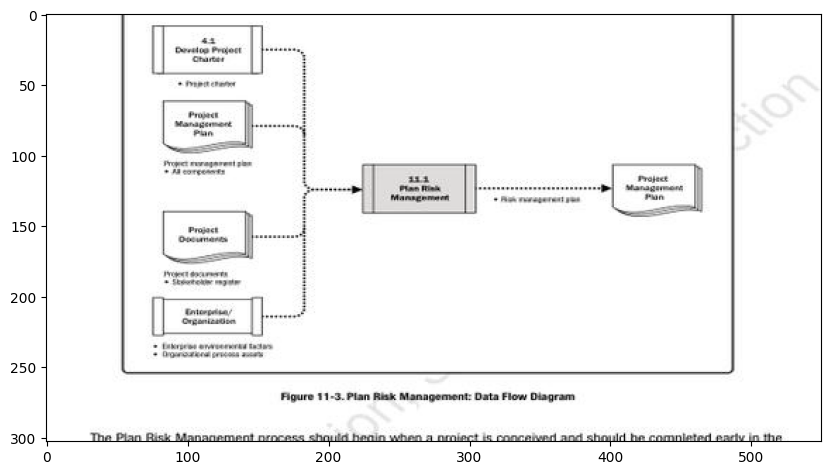

In [ ]:
from ultralytics import YOLO
import cv2
from matplotlib import pyplot as plt

model_path = '/kaggle/working/datasets/runs/detect/train/weights/best.pt'
image_path = '/kaggle/working/datasets/runs/detect/predict2/page-6.png'
img = cv2.imread('resized_image.jpg')

model = YOLO(model_path)

results = model(resized_image)[0]

for box in boxes:
    xyxy = box.xyxy[0].cpu().numpy()
    x1, y1, x2, y2 = xyxy
    print(f"Bounding Box Coordinates: x1={x1}, y1={y1}, x2={x2}, y2={y2}")
        # Crop the image using OpenCV
    cropped_image = img[int(y1):int(y2), int(x1):int(x2)]

    plt.figure(figsize=(10, 10))
    plt.imshow(cropped_image)
    plt.show()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs


Bounding Box Coordinates: x1=49.0, y1=67.0, x2=599.0, y2=370.0


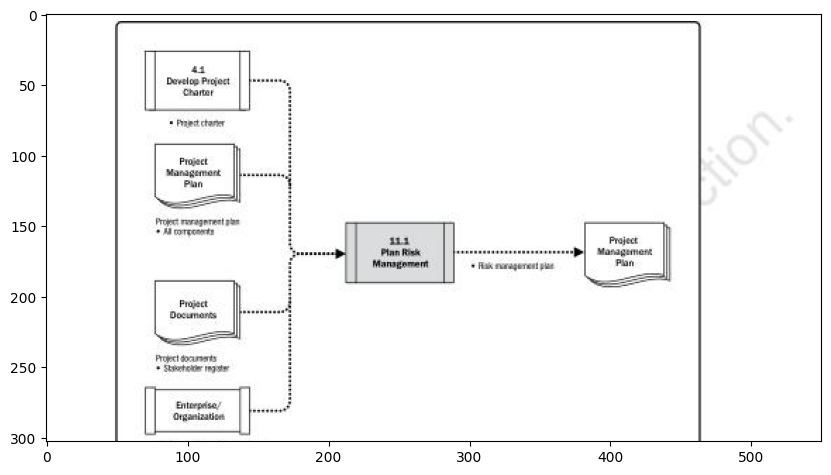

In [ ]:
from ultralytics import YOLO
import cv2
from matplotlib import pyplot as plt

model_path = '/kaggle/working/datasets/runs/detect/train/weights/best.pt'
image_path = '/kaggle/working/datasets/runs/detect/predict2/page-6.png'
img = Image.open('resized_image.jpg')

model = YOLO(model_path)

results = model('resized_image.jpg')[0]

for box in boxes:
    xyxy = box.xyxy[0].cpu().numpy()
    x1, y1, x2, y2 = xyxy
    cls = int(box.cls[0])  # Get the class label as an integer

    # Check if the class is "figures" (you may need to adjust the class label)
    if cls == 1:
        print(f"Bounding Box Coordinates: x1={x1}, y1={y1}, x2={x2}, y2={y2}")

        # Crop the image using OpenCV
        cropped_image = img.crop((x1, y1, x2, y2))
        # Create a larger figure
        plt.figure(figsize=(10, 10))  # Set the size as needed

        # Display the cropped image in the larger figure
        plt.imshow(cropped_image)
        plt.show()


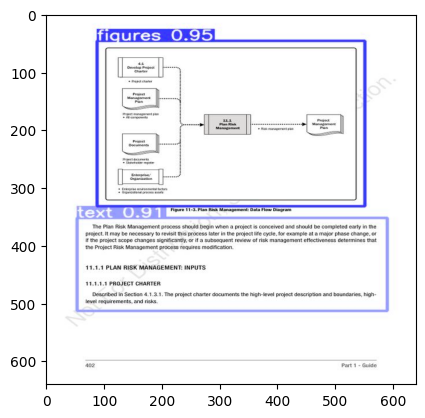

In [ ]:
plt.imshow(img)
plt.show()